In [13]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly
import plotly.express as px
from scipy import stats
from func.myfunc import *

from sklearn import linear_model
from sklearn import preprocessing
from sklearn import model_selection

from sklearn import metrics
from sklearn import feature_selection
import category_encoders as ce

# Для рендера в ноутбуке, и работы через nbviewer
import plotly.io as pio
pio.renderers.default='notebook'



In [14]:
# Загружаем и проверяем данные
data = pd.read_csv('./data/auto_data.csv')
display(data.head())

# Выводим суммарное количество пропусков
display(f'Количество пропусков в данных: {data.isna().sum().sum()}')


,availability,generation,year,mileage,body,color,tax,transmission,drive,steering_wheel,...,pedal_pads,door_sills,seat_count,active_suspension,sport_suspension,air_suspension,full_spare_wheel,spare_wheel,towbar,crankcase_prot
0,В наличии,Не указано,2024,15,минивэн,белый,5559,автоматическая,передний,Левый,...,Не указано,Не указано,7,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано
1,В наличии,II,2019,84936,седан,серебристый,1156,механическая,передний,Левый,...,Не указано,Не указано,5,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано
2,В наличии,Не указано,2022,54389,пикап двойная кабина,зелёный,8150,автоматическая,полный,Левый,...,Не указано,Не указано,4,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано
3,В наличии,II (981),2013,16785,купе,белый,32240,роботизированная,задний,Левый,...,Не указано,Накладки на пороги,2,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано
4,В наличии,I Рестайлинг,2012,270000,седан,чёрный,7600,роботизированная,передний,Левый,...,Не указано,Накладки на пороги,4,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано,Не указано


'Количество пропусков в данных: 0'

## Визуальный анализ данных

,year,mileage,tax,eng_hpower,price,lat,long,count_options,cnt_media,cnt_interior,cnt_exterior,cnt_visibility,cnt_safety,cnt_comfort,cnt_protection,cnt_other,d_size,seat_count
count,35846.000000,35846.000000,35846.000000,35846.000000,3.584600e+04,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000,35846.000000
mean,2014.535569,128829.830079,11580.990822,179.545723,2.531546e+06,51.938978,60.115387,30.791860,3.553869,6.551972,1.134408,3.174636,5.727278,8.924594,1.513195,0.389695,7.194136,4.119260
std,6.914834,96373.572090,23288.764696,109.643429,4.817691e+06,5.823592,31.670627,29.710831,3.759730,6.312309,1.283004,3.475923,6.304648,8.849737,1.368612,0.728614,8.778138,2.112257
min,1938.000000,1.000000,0.000000,29.000000,2.500000e+04,43.115068,30.158655,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2011.000000,48671.500000,1680.000000,110.000000,8.000000e+05,45.035153,39.709606,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
50%,2016.000000,118000.000000,4095.000000,150.000000,1.500552e+06,54.967814,43.596658,25.000000,2.000000,5.000000,1.000000,2.000000,4.000000,8.000000,2.000000,0.000000,0.000000,5.000000
75%,2020.000000,190000.000000,9375.000000,200.000000,2.750000e+06,56.009117,82.951599,53.000000,6.000000,10.000000,2.000000,6.000000,10.000000,16.000000,3.000000,1.000000,17.000000,5.000000
max,2024.000000,1000000.000000,538650.000000,1500.000000,3.907279e+08,59.960674,135.076297,148.000000,18.000000,36.000000,8.000000,14.000000,29.000000,39.000000,5.000000,6.000000,24.000000,9.000000


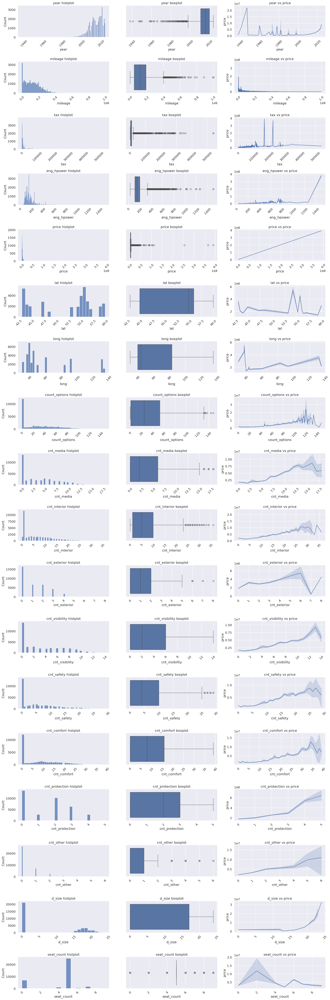

In [15]:
# Рассчитаем описательные статистики для количественных переменных
display(data.describe())

# Выделяем имена числовых признаков в виде списка для удобства дальнейшей
# работы
types = data.dtypes
num_features = list(types[(types != 'object')].index)

# Для каждого числового признака построим гистограмму и диаграмму размаха,
# а также линейный график зависимости целевого признака от каждого из
# факторов. Зададим количество числовых признаков
n = len(num_features)

# Задаем масштаб размера шрифтов
sns.set(font_scale=1.2)

# Задаем фигуру n х 3 координатных плоскостей
fig, axes = plt.subplots(n, 3, figsize=(20, 60))

# Создаем цикл для всех признаков из списка числовых признаков
# i- индекс, feature - название признака в таблице
for i, feature in enumerate(num_features):

    # Строим гистограмму распределения признака
    histplot = sns.histplot(data=data, x=feature, ax=axes[i][0])

    # Добавляем подпись графику
    histplot.set_title('{} histplot'.format(feature))

    # Доьавляем сетку
    histplot.grid()

    # Добавляем поворот отметок на оси абсцисс
    histplot.xaxis.set_tick_params(rotation=45)

    # Строим диаграмму размаха
    boxplot = sns.boxplot(data=data, x=feature, ax=axes[i][1])

    # Добавляем подпись графику
    boxplot.set_title('{} boxplot'.format(feature))

    # Добавляем поворот отметок на оси абсцисс
    boxplot.xaxis.set_tick_params(rotation=45)

    # Строим линейный график зависимости целевого признака от текущего
    # признака
    lineplot = sns.lineplot(data=data, x=feature, y='price', ax=axes[i][2])

    # Добавляем подпись графику
    lineplot.set_title('{} vs price'.format(feature))

    # Добавляем поворот отметок на оси абсцисс
    lineplot.xaxis.set_tick_params(rotation=45)

# выравнивание графиков
plt.tight_layout()


### Выводы
* В некоторых числовых признаках присутствуют аномальные значения. Наиболее явно это видно на диаграммах размаха признаков год выпуска, пробег, налог, мощность двигателя, цена. Можно будет попробовать робастную нормализацию или просто удалить выбросы.  
* В целом все числовые признаки не имеют нормального распределения. 
* Признаки обозначающие количество опций той или иной категории, показывают наличие корреляции с признаком цены. Можно также отметить наличие связи с признаком цены  у признаков пробег, год выпуска и мощность. Но наличие аномальных значений сильно увеличивают масштаб графика и зависимость видна слабо.

In [16]:
# Создадим два списка для хранения наименований категориальных признаков
# с малым и большим количеством уникальных значений
low_uniq_cat = []
h_uniq_cat = []

# В цикле перебираем категориальные признаки
for feature in list(types[(types == 'object')].index):

    # Проверяем число уникальных значений и заносим признак в
    # соответствующий список
    if data[feature].nunique() <= 10:
        low_uniq_cat.append(feature)
    else:
        h_uniq_cat.append(feature)


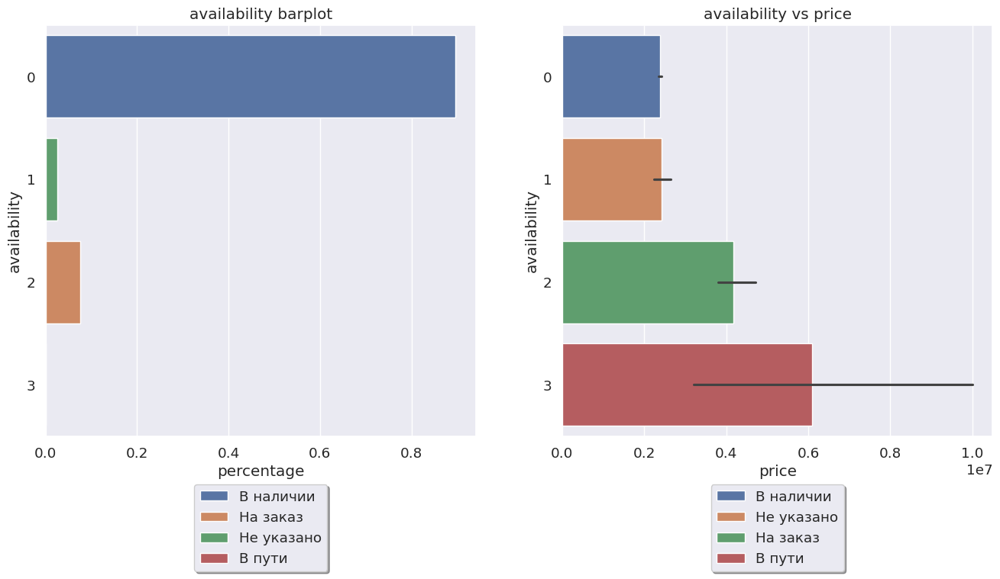

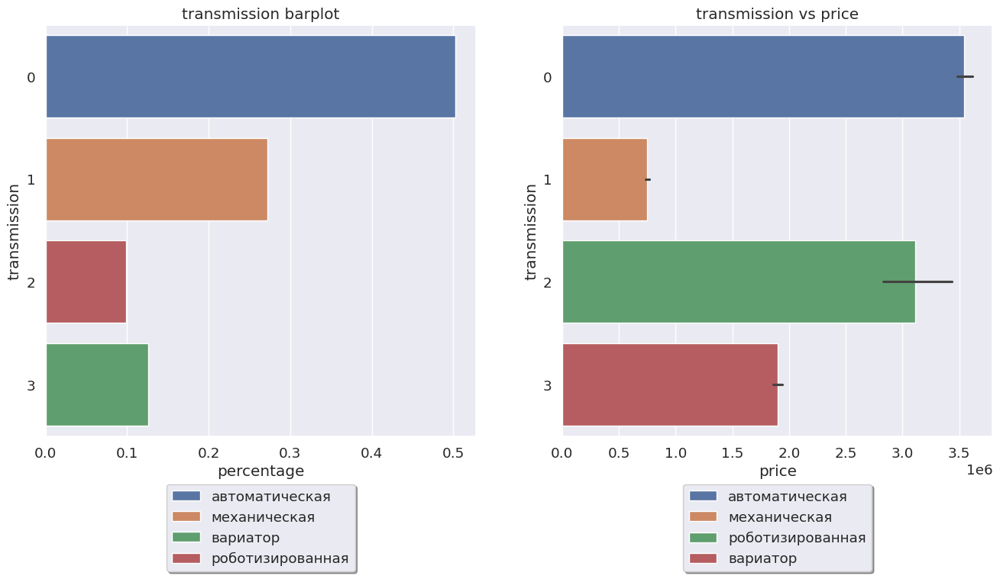

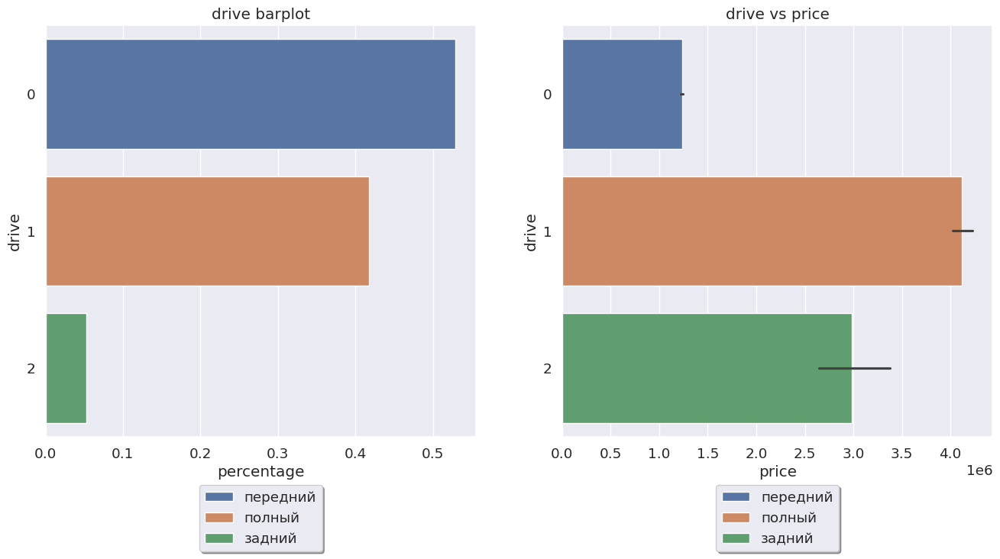

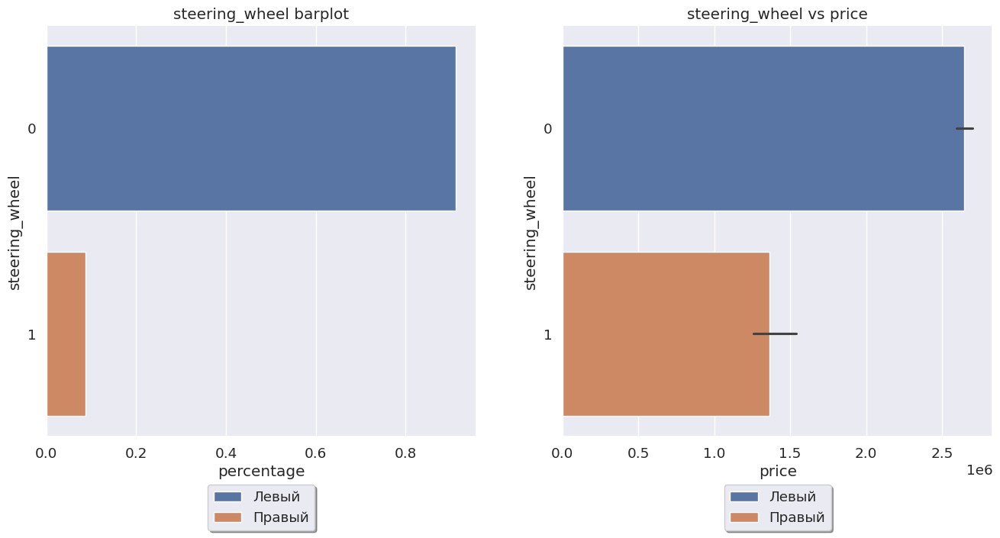

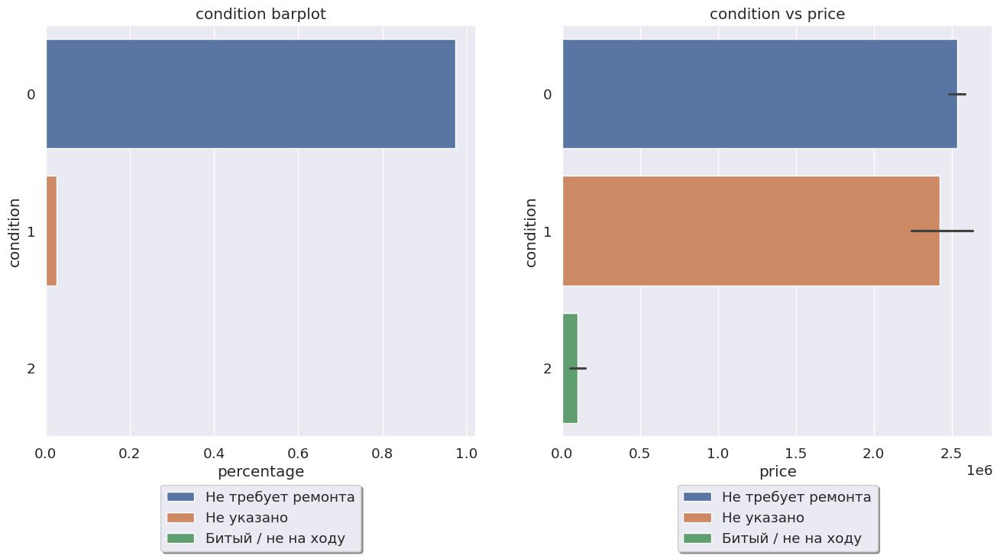

...

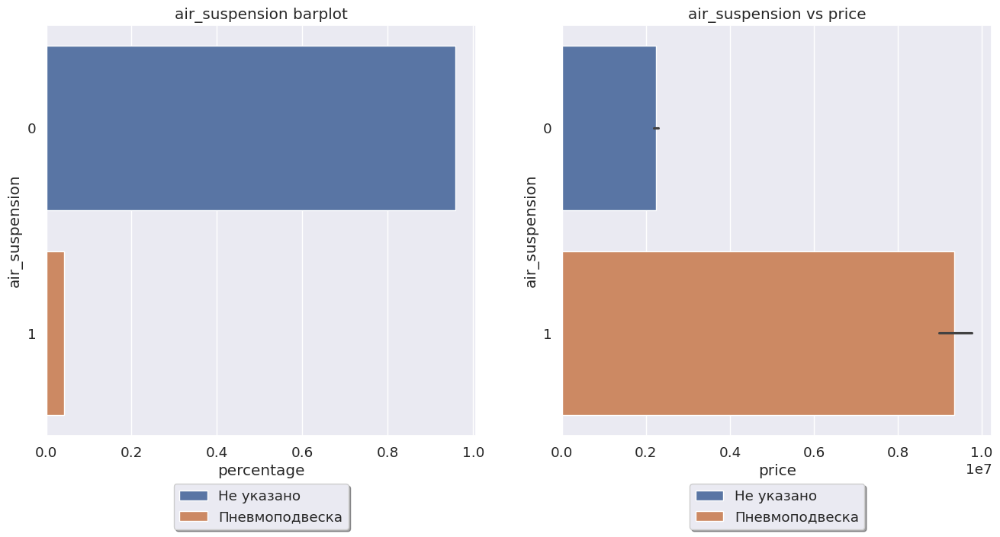

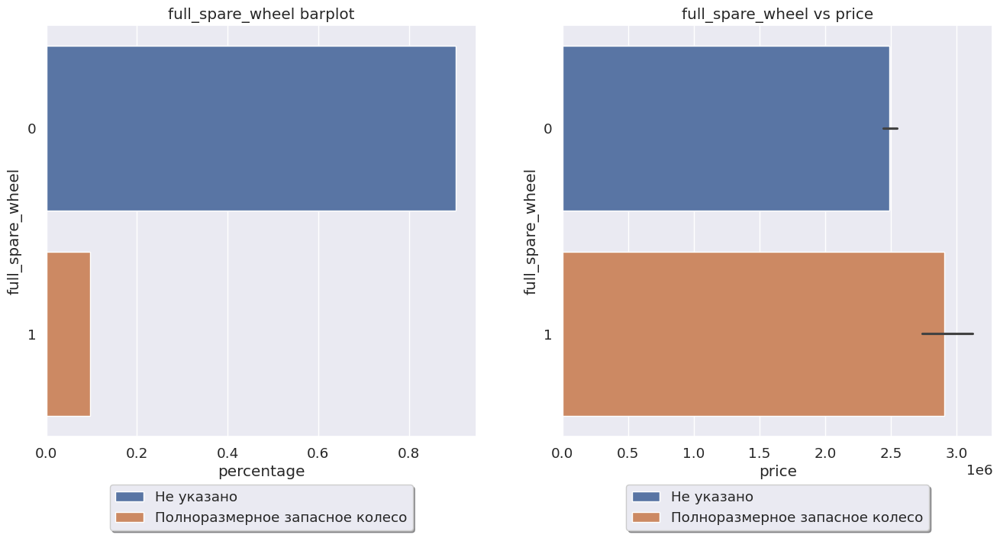

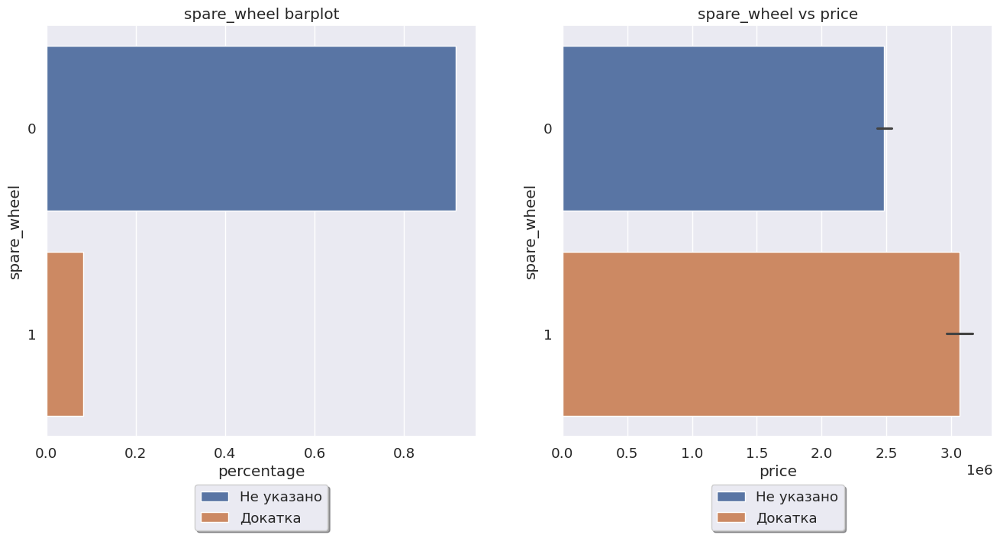

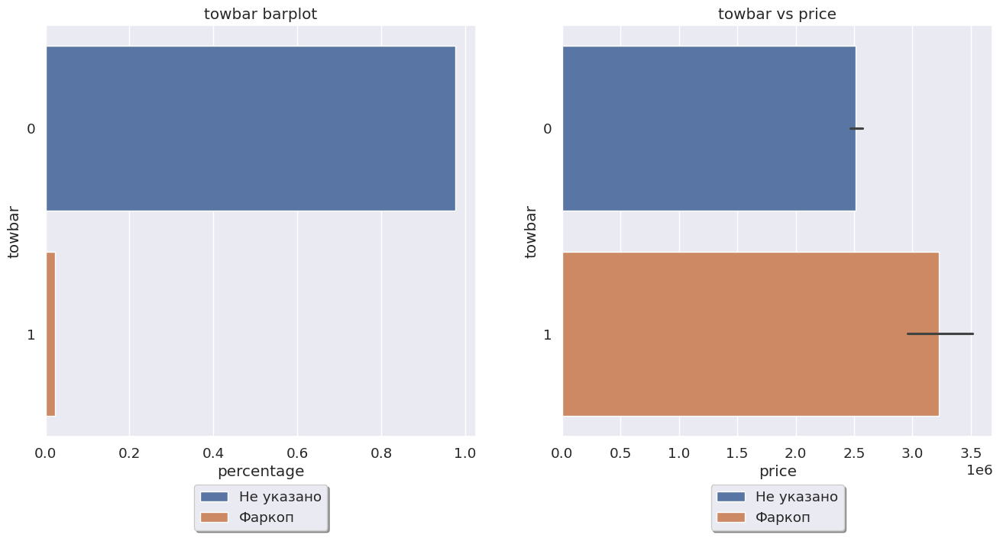

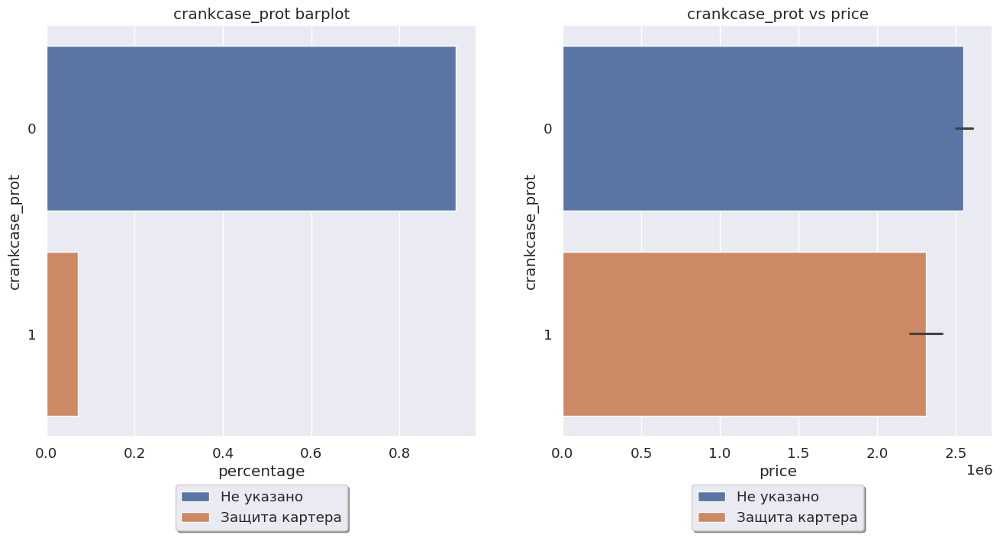

In [17]:
# Создаём цикл для признаков из списка категориальных признаков
for feature in low_uniq_cat:

    # Определим фигуру n х 2 координатных плоскостей
    fig, axes = plt.subplots(ncols=2, figsize=(16, 7), squeeze=True)

    # Наименования категорий в признаках иногда очень длинные и
    # не помещаются на оси диаграммы. Заменим их числами, а значения выведем
    # в легенде. Создаем словарь для хранения наименований категорий
    y_ticks = {}

    # В цикле Заполняем словарь по ключу - текущий номер итерации значениями
    # текущего наименования категории
    for num, value in enumerate(data[feature].unique()):
        y_ticks[num] = value

    # определяем порядок наименований категорий
    cat_order = y_ticks.values()

    # Строим количественную столбчатую диаграмму для долевого соотношения
    # каждой из категорий в данных
    count_data = (data[feature].value_counts(normalize=True)
                  .sort_values(ascending=False)
                  .rename('percentage')
                  .reset_index())
    count_barplot = sns.barplot(data=count_data,
                                y=feature,
                                x='percentage',
                                ax=axes[0],
                                legend='full',
                                order=cat_order,
                                hue=feature
                                )

    # Задаем заголовок графика
    count_barplot.set_title('{} barplot'.format(feature))

    # Определяем переменную для изменения меток оси у
    y = np.arange(len(y_ticks))

    # Задаем толщину полос
    width = 0.4

    # Изменяем отображение меток
    axes[0].set_yticks(y)
    axes[0].set_yticklabels(list(y_ticks))

    # Задаем параметры отображения легенды и закрепляем её под графиками
    axes[0].legend(loc='upper center',
                   bbox_to_anchor=(0.5, -0.10),
                   fancybox=True,
                   shadow=True
                   )

    # Строим столбчатую диаграмму средней цены в зависимости от категории
    mean_barplot = sns.barplot(data=data,
                               y=feature,
                               x='price',
                               ax=axes[1],
                               legend='full',
                               order=cat_order,
                               hue=feature
                               )

    # Задаем наименование графика
    mean_barplot.set_title('{} vs price'.format(feature))

    # Изменяем отображение меток
    axes[1].set_yticks(y)
    axes[1].set_yticklabels(list(y_ticks))

    # Задаем параметры отображения легенды и закрепляем её под графиками
    axes[1].legend(loc='upper center',
                   bbox_to_anchor=(0.5, -0.10),
                   fancybox=True,
                   shadow=True
                   )

    # Так как графиков очень много закрываем их после отображения, чтобы
    # не засорять память
    plt.show()
    plt.close()


### Выводы
* Большинство из рассмотренных признаков являются бинарными (имеют только 2 значения).
* Часть признаков встречается очень редко. Чаще всего это экзотичные для повседневных авто опции, например, ночное виденье, спортивная подвеска, аэрография. Скорее всего такие признаки будут мало информативными.
* Признаки наличие, трансмиссия, тип привода, состояние авто, количество владельцев, птс и тип двигателя — имеют более 2-ух значений. Так как признаков у нас и так очень много можно попробовать двоичное кодирование для номинальных признаков со значением более двух.
* Наличие некоторых признаков не сильно влияет на увеличение цены: ксеноновые и противотуманные фары, усилитель руля, легкосплавные диски, темный салон, складывающееся заднее сиденье,  функция складывания спинки сиденья пассажира.
* Наличие признаков прикуриватель и пепельница,  защита картера даже снижают цену автомобиля.


In [18]:
# Посмотрим на количество значений в оставшихся признаках
for elem in h_uniq_cat:
    print(elem, len(data[elem].unique()))
    print('-'*25)


generation 816
-------------------------
body 25
-------------------------
color 16
-------------------------
brand 158
-------------------------
model 2618
-------------------------
sity 16
-------------------------


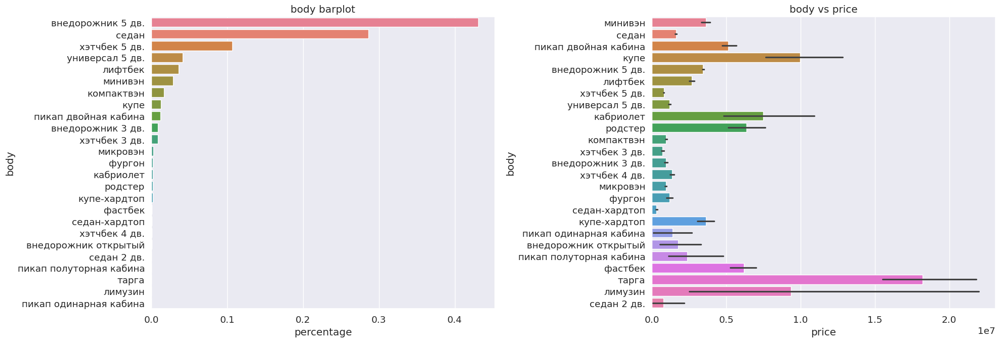

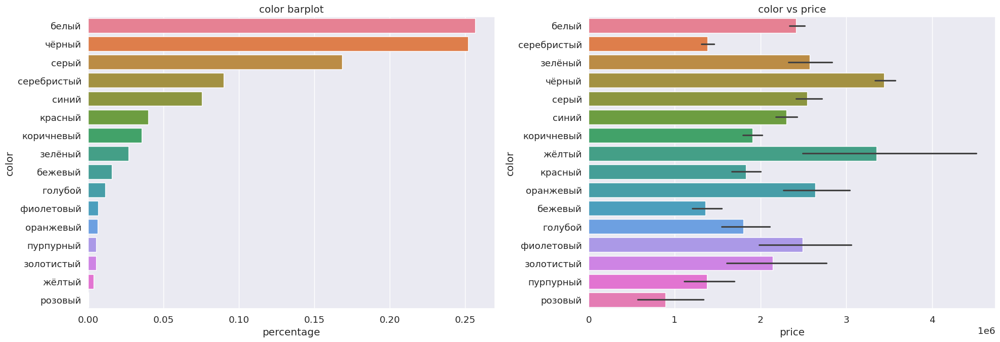

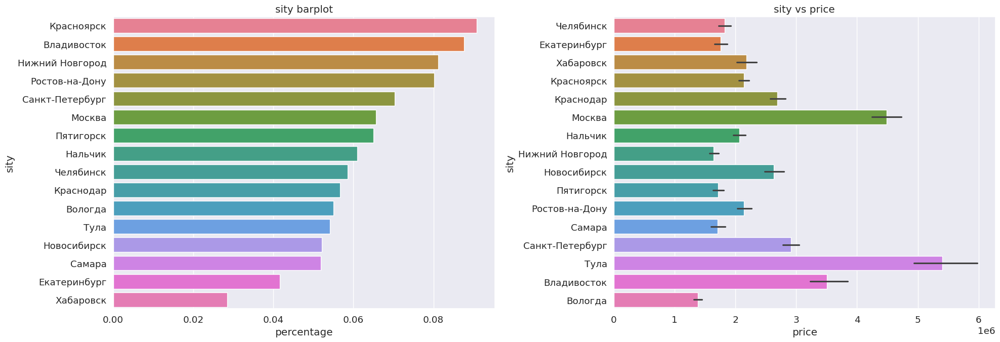

In [19]:
# Создаём цикл для признаков из списка
ls = ['body', 'color', 'sity']
for feature in ls:

    # Определим фигуру n х 2 координатных плоскостей
    fig, axes = plt.subplots(ncols=2, figsize=(20, 7), squeeze=True)

    # Строим количественную столбчатую диаграмму для долевого соотношения
    # каждой из категорий в данных
    count_data = (data[feature].value_counts(normalize=True)
                  .sort_values(ascending=False)
                  .rename('percentage')
                  .reset_index())
    count_barplot = sns.barplot(data=count_data,
                                y=feature,
                                x='percentage',
                                ax=axes[0],
                                legend=False,
                                hue=feature
                                )

    # Задаем заголовок графика
    count_barplot.set_title('{} barplot'.format(feature))

    # Задаем толщину полос
    width = 0.4

    # Строим столбчатую диаграмму средней цены в зависимости от категории
    mean_barplot = sns.barplot(data=data,
                               y=feature,
                               x='price',
                               ax=axes[1],
                               legend=False,
                               hue=feature
                               )

    # Задаем наименование графика
    mean_barplot.set_title('{} vs price'.format(feature))

    # Выравниваем графики
    plt.tight_layout()

    # Отображаем график и закрываем, чтобы не засорять память
    plt.show()
    plt.close()


### Выводы
* Наиболее часто встречаются авто с типом кузова внедорожники 5 дв., седаны и хэтчбеки 5дв. Самые дорогие авто имеют тип кузова тарга, купе и лимузин.
* Можно обратить что цена для авто с типом кузова хэтчбек 5дв., хэтчбек 4дв. и хэтчбек 3дв. очень близки. Если это действительно так можно будет сократить число значений в признаке объединив эти значения в одно.
* Самыые распространенные цвета авто это белый, черный и серый. Самые дорогие авто имеют черный, желтый и оранжевый цвет.
* Больше всего авто из Красноярска, Владивостока и Нижнего Новгорода. Самые дорогие авто в Туле, Москве и Владивостоке. Скорее всего признак будет сильно коррелировать с признаками широты и долготы так как по сути мы из него и сохдали эти два новых признака. Этот признак можно исключить из данных.
* В данных признаках значений более 15 - будем использовать двоичное кодирование.


In [20]:
# Для признаков с очень большим количеством уникальных значений построим
# древесные диаграммы. Создаём цикл для признаков из списка
ls = ['generation', 'brand', 'model']
for feature in ls:

    # Группируем данные по текущему признаку и считаем количество значений
    treemap_df = data.groupby(feature, as_index=False)[['price']] \
        .count().rename(columns={'price': 'count'})

    # Строим древесную диаграмму количества значений текущего признака
    fig = px.treemap(data_frame=treemap_df,
                     path=[feature],
                     values='count',
                     title=f'Treemap of count of {feature}',
                     height=500,
                     width=1000
                     )

    # Переопределяем значений выводимы во всплывающей подсказке
    fig.update_traces(
        hovertemplate='label: %{label}<br>count: %{value}<extra></extra>')

    # Задаем размер и положение названия диаграммы
    fig.update_layout(title_font_size=24, title_pad_l=250)

    # Отображаем диаграмму
    fig.show()

    # Группируем данные по текущему признаку и считаем среднюю цену для
    # каждого значения
    treemap_df = data.groupby(feature, as_index=False)[['price']].mean()

    # Строим древесную диаграмму средней цены по каждому значению текущего
    # признака
    fig = px.treemap(data_frame=treemap_df,
                     path=[feature],
                     values='price',
                     title=f'Treemap of price of {feature}',
                     height=500,
                     width=1000
                     )

    # Переопределяем значений выводимы во всплывающей подсказке
    fig.update_traces(
        hovertemplate='label: %{label}<br>price: %{value}<extra></extra>')

    # Задаем размер и положение названия диаграммы
    fig.update_layout(title_font_size=24, title_pad_l=250)

    # Отображаем диаграмму
    fig.show()


### Выводы
* Признак поколения авто имеет очень много значений. И, так как производители вводят свою индексацию поколений, вряд ли будет полезен.
* Марок авто меньше. Чаще всего встречается ВАЗ, Тойота и Киа. Наиболее дорогие Бугати, Ролс-Ройс и МакЛарен.
* Наиболее часто встречаются Гранта, Солярис и Камри. Ценой выделяются наиболее редкие модели авто.
* В целом эти 3 признака имеют слишком много уникальных значений и привязаны к конкретным автомобилям. Здесь потребуется использовать двоичное (бинарное) кодирование.

## Статистический анализ данных

По результатам визуального анализа были сделаны предположения:
   + наличие некоторых признаков не сильно влияет на увеличение цены: ксеноновые и противотуманные фары, усилитель руля, легкосплавные диски, темный салон, складывающееся заднее сиденье,  функция складывания спинки сиденья пассажира.
   + указанные в объявлении признаки прикуриватель и пепельница, а также защита картера - снижают цену авто. 
   + цена для авто с типом кузова хэтчбек 5дв., хэтчбек 4дв. и хэтчбек 3дв. очень близки.
   
Выберем тест для первых двух случаев:

   + Тип признака (цена) - количественный признак;
   + количество сравниваемых групп - две (признаки бинарные);
   + группы независимые;           

следовательно нам подходит двувыборочный t-критерий или u - критерий Манна-Уитни в зависимости от распределения признака.

Для третьего случая:
   + Тип признака (цена) - количественный признак;
   + количество сравниваемых групп - три;
   + группы независимые;     
             
следовательно нам подходит однофакторный дисперсионный анализ или критерий Краскела-Уоллиса в зависимости от распределения признака в выборках.

Проверку на нормальность проведем с помощью критерия согласия Пирсона. Тест Шапиро-Уилка нам не подходит из-за большого размера выборок.   
        
Гипотезы теста на нормальность:                
  + Нулевая гипотеза (*H0*): распределение данные является нормальным.
  + Альтернативная гипотеза (*H1*): распределение данных отлично от нормального.

In [21]:
# Задаем уровень значимости
alpha = 0.05

# Создадим список с наименованиями интересующих нас признаков
feature_ls = ['xenon_headlights',
              'anti_frog',
              'amplifier_wheel',
              'd_type_light',
              'in_color_dark',
              'fold_rear_seat',
              'backrest_fold',
              'lighter_ashtray',
              'crankcase_prot'
              ]

# Создадим список для наименований признаков с нормальным распределением
normal_ls = []

# В цикле проведем тест на нормальность
for name in feature_ls:

    # Подготовим выборки
    price_feature_on = data[data[name] != 'Не указано']['price']
    price_feature_off = data[data[name] == 'Не указано']['price']

    # проводим тест на нормальность для авто с наличием признака
    result = stats.normaltest(price_feature_on)

    # если распределение отлично от нормального ничего не делаем
    if result[1] <= 0.05:
        continue

    # если оно нормальное - заносим имя признака в список
    else:
        normal_ls.append(name)

    # Повторяем тест для авто с отсутствующим признаком
    result = stats.normaltest(price_feature_off)
    if result[1] <= 0.05:
        continue
    else:
        normal_ls.append(name)

# Выполним проверку на нормальность для выборок из признака тип кузова
# Задаем список с интересующими нас значениями из признака тип кузова
value_ls = ['хэтчбек 5 дв.', 'хэтчбек 4 дв.', 'хэтчбек 3 дв.']

# Задаем счетчик нормального распределения признака
norm_counter = 0

# В цикле проверяем нормальность распределения
for val in value_ls:

    # Проводим тест на нормальность для авто с текущим типом кузова.
    # Значений признака не очень много поэтому здесь можно применить тест
    # Шапиро-Уилка
    result = stats.shapiro(data[data['body']==val]['price'])

    # если распределение отлично от нормального ничего не делаем
    if result[1] <= alpha:
        continue

    # если оно нормальное увеличиваем счетчик на единицу
    else:
        norm_counter += 1

# Если счетчик равен 3 заносим имя признака в список
if norm_counter == 3:
    normal_ls.append('body')

# Выводим количество признаков с нормальным распределением
print(f'Количество признаков с нормальным распределением: {len(set(normal_ls))}')


Количество признаков с нормальным распределением: 0


Проверка показала, что наши признаки не распределены нормально. Соответственно нам нужны непараметрические тесты: U-критерий Манна-Уитни и критерий Краскела-Уоллиса

Сначала проведем тест  U-критерий Манна-Уитни.                 
Согласно документации: 

"U-критерий Манна-Уитни — это непараметрическая проверка нулевой гипотезы о том, что распределение, лежащее в основе выборки x, такое же, как распределение, лежащее в основе выборки y. Пусть F(u) и G(u) — кумулятивные функции распределения распределений, лежащих в основе x и y соответственно. Тогда возможны следующие альтернативные гипотезы:

«двусторонняя»: распределения не равны, т.е. F(u) ≠ G(u) хотя бы для одного u.

«меньше»: распределение, лежащее в основе x , стохастически меньше, чем распределение, лежащее в основе y , т.е. F(u) > G(u) для всех u.

«больше»: распределение, лежащее в основе x , стохастически больше, чем распределение, лежащее в основе y , т.е. F(u) < G(u) для всех u.

Обратите внимание, что математические выражения в альтернативных гипотезах, приведенных выше, описывают CDF основных распределений. На первый взгляд направления неравенств кажутся несовместимыми с описанием на естественном языке, но это не так. Например, предположим, что X и Y — случайные величины, которые следуют распределениям с CDF F и G соответственно. Если F(u) > G(u) для всех u, образцы, взятые из X, имеют тенденцию быть меньше, чем образцы, взятые из Y.
Кумулятивная функция распределения (CDF) описывает вероятности случайной величины, имеющей значения, меньшие или равные x."

Сформулируем гипотезы

Нулевая гипотеза (*H0*): CDF распределение цены при наличии признака (*$\mu_1$*) больше или равно CDF распределению цены при отсутствии признака (*$\mu_2$*).          

 $$H0:\mu_1\geq \mu_2$$
    


Альтернативная гипотеза (*H1*):  CDF распределение цены при наличии признака (*$\mu_1$*) меньше CDF распределения цены при отсутствии признака (*$\mu_2$*).

$$H1:\mu_1 < \mu_2$$


In [22]:
# В цикле проведем тест на нормальность
for name in feature_ls:

    # Подготовим выборки
    price_feature_on = data[data[name] != 'Не указано']['price']
    price_feature_off = data[data[name] == 'Не указано']['price']

    # Проводим тест и интерпретируем результат
    _, p = stats.mannwhitneyu(price_feature_on,
                              price_feature_off,
                              alternative='greater'
                              )
    if p <= alpha:
        print(f'p-значение {p} меньше, чем заданный уровень значимости '
              f'{alpha}. Отвергаем нулевую гипотезу в пользу альтернативной.')
        print(f'При наличии признака {name} цена авто выше')
    else:
        print(f'p-значение {p} больше, чем заданный уровень значимости '
              f'{alpha}. У нас нет оснований отвергнуть нулевую гипотезу.')
        print(f'При наличии признака {name} цена'
              'авто меньше или не изменяется')
    print('-' * 50)


p-значение 6.632710476982724e-76 меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.
При наличии признака xenon_headlights цена авто выше
--------------------------------------------------
p-значение 9.014096066625758e-150 меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.
При наличии признака anti_frog цена авто выше
--------------------------------------------------
p-значение 4.677412100793083e-11 меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.
При наличии признака amplifier_wheel цена авто выше
--------------------------------------------------
p-значение 4.338448983138686e-65 меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.
При наличии признака d_type_light цена авто выше
--------------------------------------------------
p-значение 9.155222263162828e-38 меньше, чем заданный уровень значимост

Проведем тест Краскела - Уоллиса чтобы определить есть ли разница в цене авто с типом кузова хэтчбек 5 дв., хэтчбек 4 дв., хэтчбек 3 дв.

Сформулируем нулевую и альтернативные гипотезы

Нулевая гипотеза: медианное значение цены авто с типом кузова хэтчбек 5 дв. ($\mu_1$), хэтчбек 4 дв. ($\mu_2$), хэтчбек 3 дв. ($\mu_3$) одинаково.

$$H0:\mu_1 = \mu_2 = \mu_3$$

Альтернативная гипотеза: медианное значение цены авто с типом кузова хэтчбек 5 дв. ($\mu_1$), хэтчбек 4 дв. ($\mu_2$), хэтчбек 3 дв. ($\mu_3$) отличается.

$$H1:\mu_1 \neq \mu_2 \neq \mu_3$$

In [23]:
# Подготовим выборки по типу кузова
m_1 = data.loc[data['body']=='хэтчбек 5 дв.','price']
m_2 = data.loc[data['body']=='хэтчбек 4 дв.','price']
m_3 = data.loc[data['body']=='хэтчбек 3 дв.','price']

# проводим тест и интерпритируем результат
_, p = stats.kruskal(m_1, m_2, m_3)
decision_hypothesis(p)


p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05.Отвергаем нулевую гипотезу в пользу альтернативной.


### Выводы    
С помощью статистических тестов удалось определить следующее:
+ наличие признаков ксеноновые и противотуманные фары, усилитель руля, легкосплавные диски, темный салон, складывающееся заднее сиденье, функция складывания спинки сиденья пассажира оказывает статистически значимое влияние на увеличение цены автомобиля. При наличии признака цена выше.
+ указанные в объявлении признаки прикуриватель и пепельница, а также защита картера - также статистически значимо влияют на цену автомобиля. При наличии признака цена выше.
+ существует статистически значимая разница в медианном значении цены для автомобилей с типом кузова хэтчбек 5дв., хэтчбек 4дв. и хэтчбек 3дв. Объединять эти значения не будем.